[Step 8](https://github.com/morris-lab/CellOracle/tree/master/docs/notebooks/04_Network_analysis)

In [1]:
goi="KLF6_ELF3_KLF10"
save_folder=f"per_{goi}"
res="per_aPTxPTS12_"
inputdata=""

In [2]:
import os
import sys

import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import celloracle as co
co.__version__
import os, sys, shutil, importlib, glob
from tqdm.notebook import tqdm

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [3]:
#1. Load data
# Load the tutorial oracle object.
links=co.load_hdf5(file_path=f"{res}links.celloracle.links")
oracle = co.load_hdf5(f"{res}scMEGA_cor40_step3.celloracle.oracle")

In [3]:
plt.rcParams["font.family"] = ""
plt.rcParams["figure.figsize"] = [5,5]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams.update({'font.size': 15})
%matplotlib inline

# Make folder to save plots
save_folder = f"figures_scMEGA_PERT_{goi}"
os.makedirs(save_folder, exist_ok=True)


In [5]:
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.12.0
    n_cells: 11917
    n_genes: 36554
    cluster_name: louvain_annot
    dimensional_reduction_name: X_draw_graph_fa
    n_target_genes_in_TFdict: 16893 genes
    n_regulatory_in_TFdict: 1091 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 864 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 15388 genes
    k_for_knn_imputation: 297
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Done

# Figure 6b

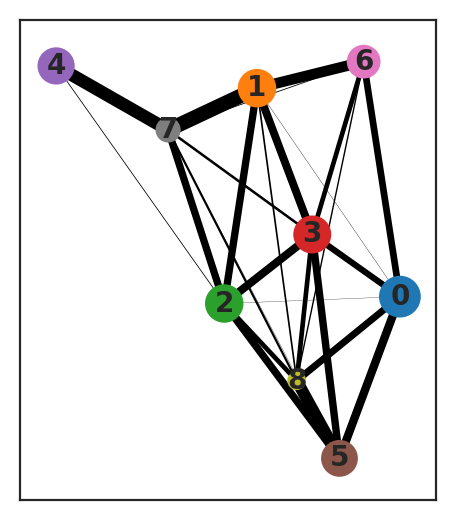

In [69]:
plt.rcParams["figure.figsize"] = [3, 3]
plt.rcParams.update({'font.size': 10})

sc.pl.paga(oracle.adata,save=f"{save_folder}{goi}_network_lovain.pdf",show=False)
sc.pl.paga(oracle.adata,save=f"{save_folder}{goi}_network_lovain.png")
plt.show()

# Figure 6 a and c

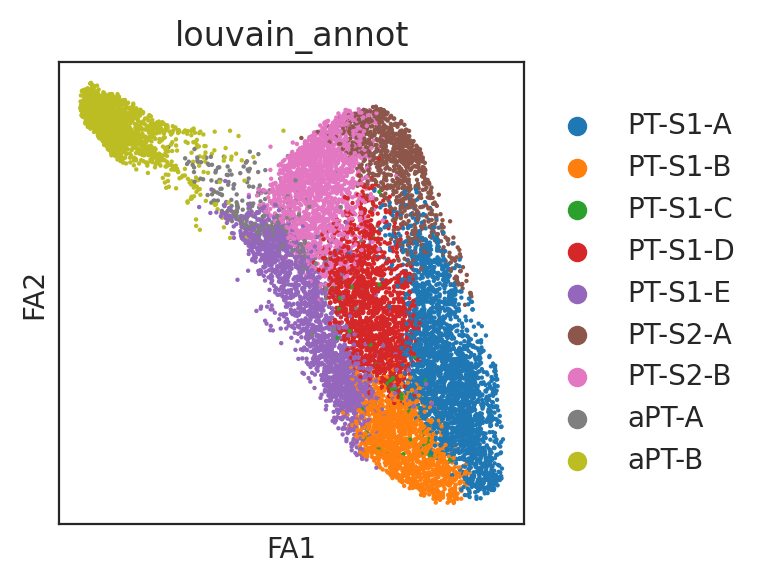

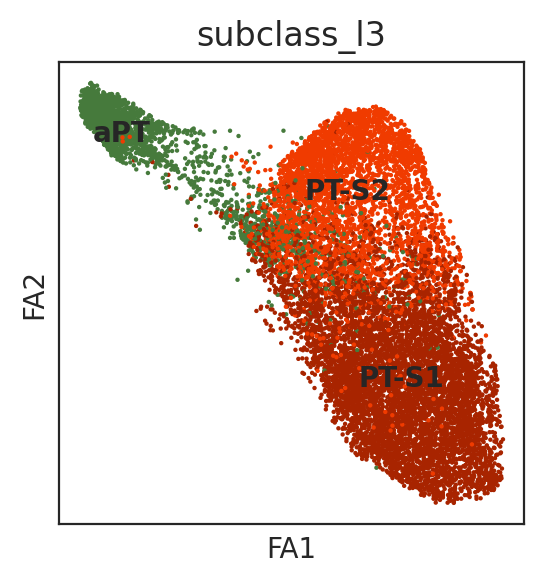

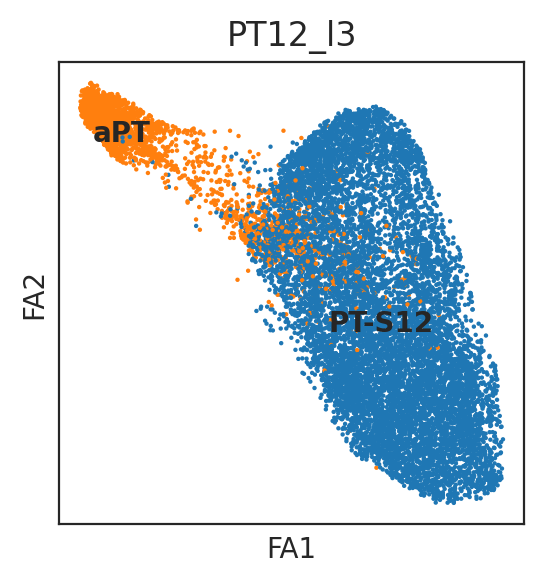

In [72]:
plt.rcParams["figure.figsize"] = [3, 3]
oracle.adata.uns['subclass_l3_colors']=["#A82400","#F03B00","#467a3c"]
oracle.adata.uns['louvain_colors']=['#467a3c', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
       '#e377c2', '#7f7f7f', '#bcbd22']
sc.pl.draw_graph(oracle.adata, color=['louvain_annot'],size=10,save="_louvain_annot")
sc.pl.draw_graph(oracle.adata, color=['subclass_l3'],size=10,save="_subclass_l3",
          legend_loc='on data') 
sc.pl.draw_graph(oracle.adata, color=['PT12_l3'],size=10,save="_PT12_l3",
          legend_loc='on data') 

In [7]:
# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle.simulate_shift(perturb_condition={"KLF6": 0.0,"ELF3": 0.0,"KLF10": 0.0},
                      n_propagation=3)

In [8]:
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200, knn_random=True, sampled_fraction=1)

# Calculate embedding 
oracle.calculate_embedding_shift(sigma_corr = 0.05)


In [4]:
oracle.to_hdf5(f"{res}scMEGA_cor40_{goi}_step1.celloracle.oracle")

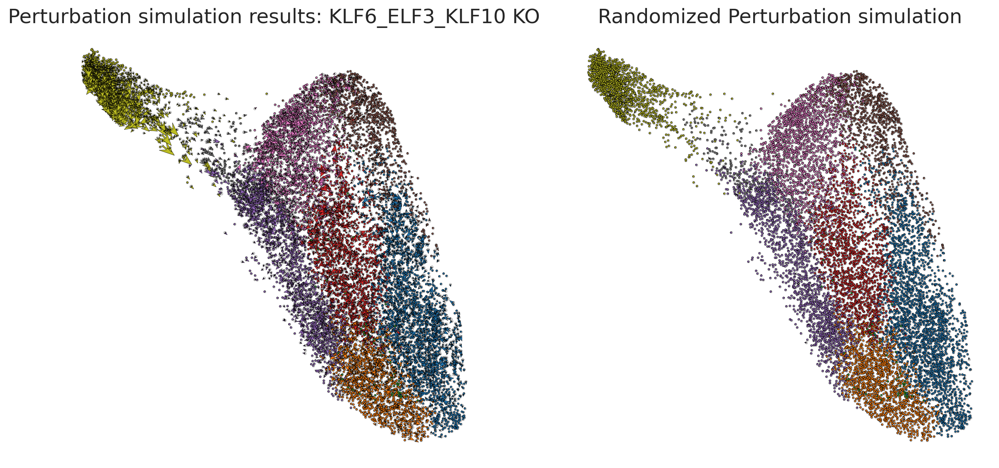

In [5]:
#Quiver plot: Show the direction of cell transition at single cell resolution
fig, ax = plt.subplots(1, 2,  figsize=[15, 7])

scale = 40 # Show quiver plot
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Perturbation simulation results: {goi} KO")

# Show quiver plot that was calculated with randomized transition probability.
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized Perturbation simulation")


plt.savefig(f"{save_folder}/{goi}_Quiver.pdf")
plt.savefig(f"{save_folder}/{goi}_Quiver.png")
plt.show()


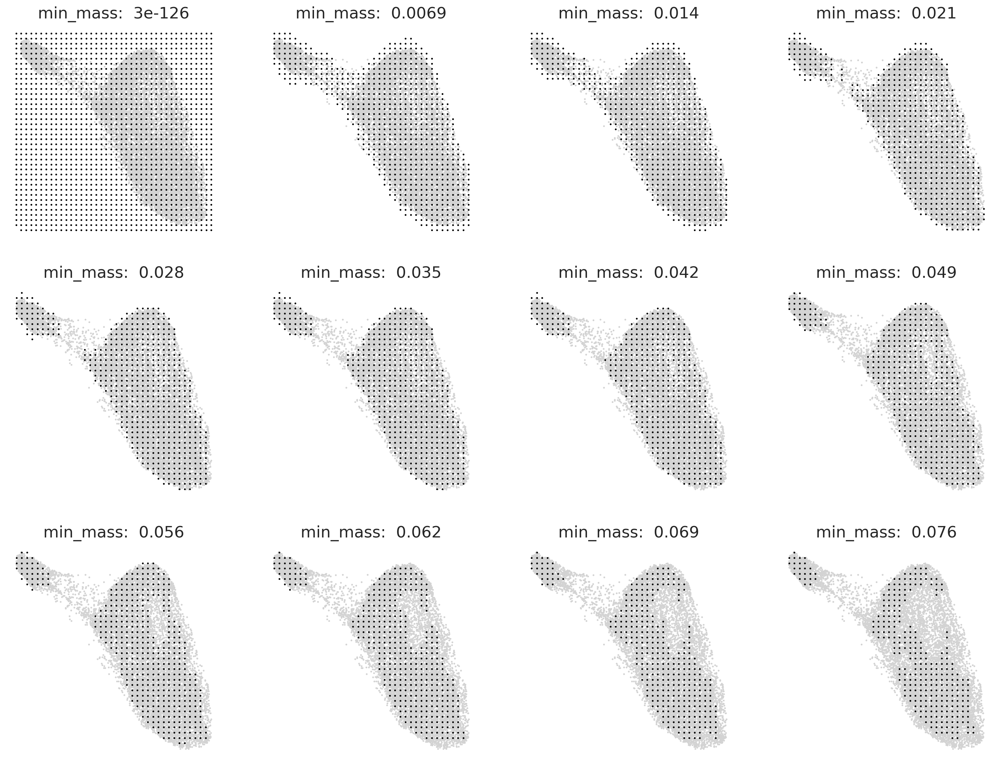

In [8]:
# 4.2. Vector field graph

# We will visualize the simulation results as a vector field on a digitized grid. Single cell transition vectors are grouped by grid point.
# 4.2.1 Find parameters for n_grid and min_mass

# n_grid: Number of grid points.

# min_mass: Threshold value for the cell density. The appropriate values for these parameters depends on the data. Please find appropriate values using the helper functions below.

# n_grid = 40 is a good starting value.
n_grid = 40
oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)

#Please run oracle.suggest_mass_thresholds() to display a range of min_mass parameter values and choose a value to fit the data.

# Search for best min_mass.
oracle.suggest_mass_thresholds(n_suggestion=12)

plt.savefig(f"{save_folder}/{goi}_{n_grid}_n_grid.pdf")
plt.savefig(f"{save_folder}/{goi}_{n_grid}_n_grid.png")
plt.show()

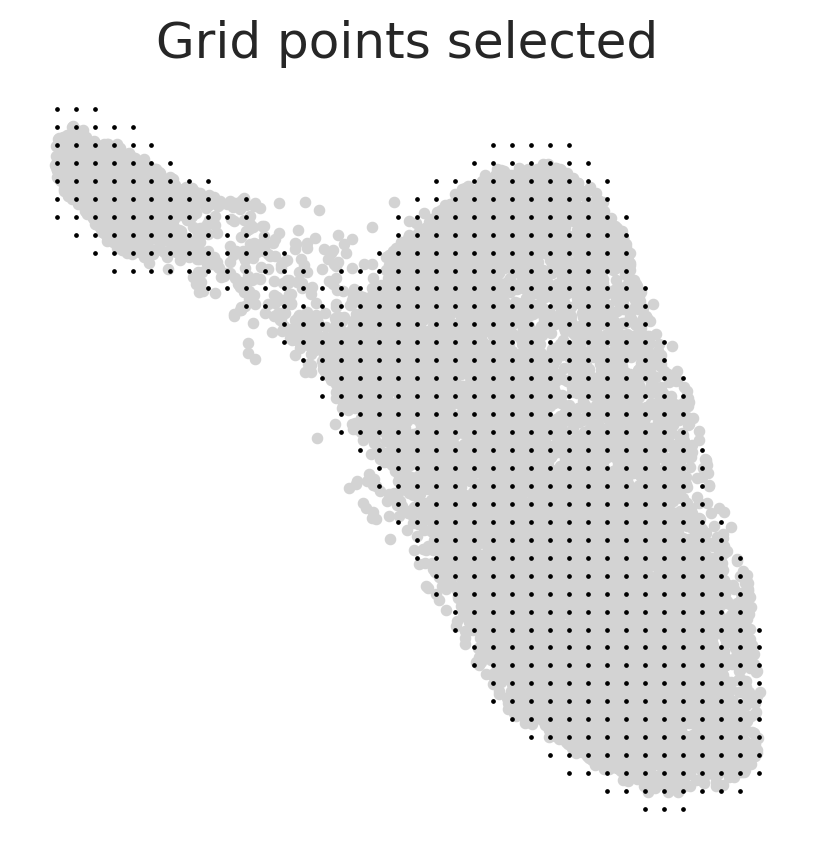

In [7]:
#According to the results, the optimal min_mass is around 0.0075.
min_mass = 0.014
oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

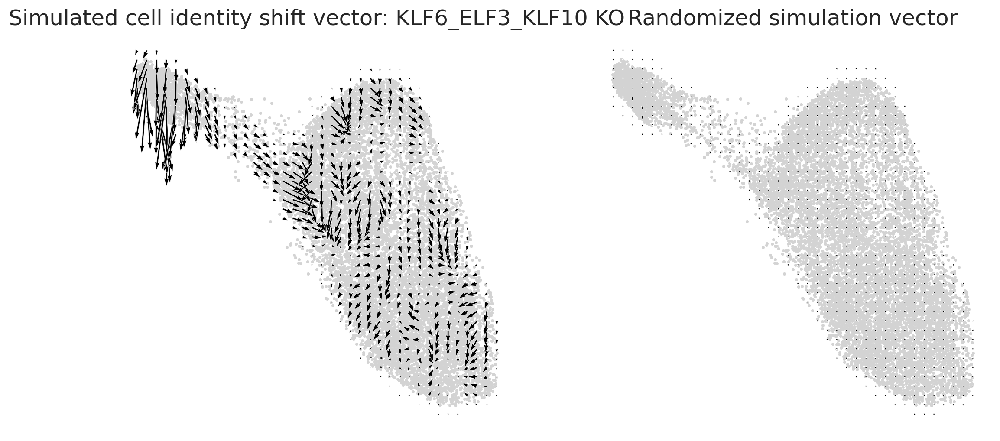

In [9]:
# 4.2.2 Plot vector fields

#     Again, we need to adjust the scale parameter. Please seek to find the optimal scale parameter that provides good visualization.

#     If you don't see any vector, you can try the smaller scale parameter to magnify the vector length. However, if you see large vectors in the randomized results (right panel), it means the scale parameter is too small.

fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 0.30
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.savefig(f"{save_folder}/{goi}_SimCellIdentityShift.pdf")
plt.savefig(f"{save_folder}/{goi}_SimCellIdentityShift.png")
plt.show()

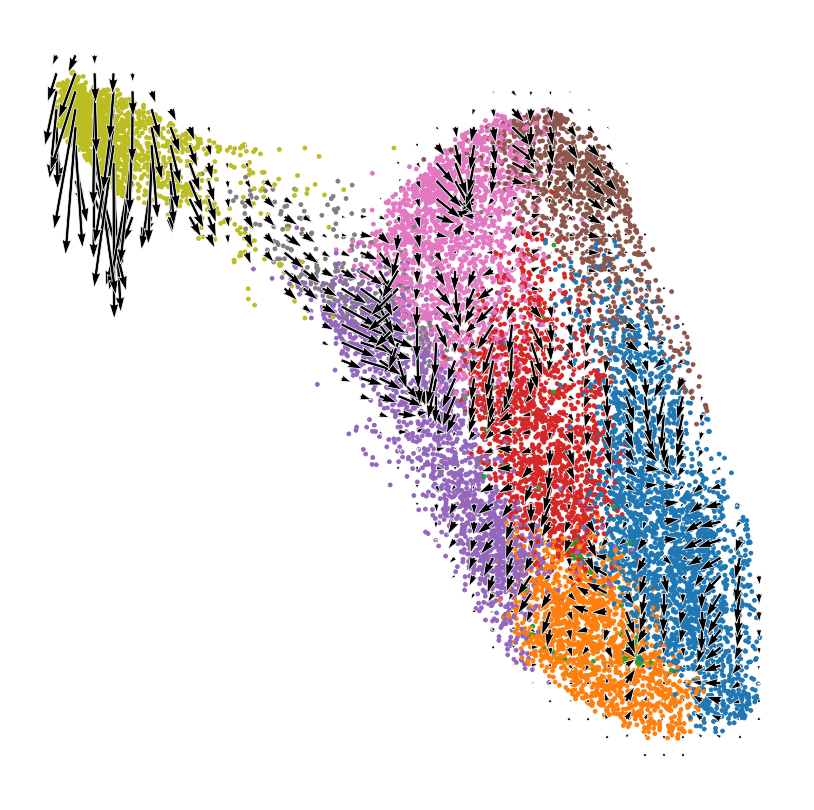

In [10]:
# Plot vector field with cell cluster 
fig, ax = plt.subplots(figsize=[5, 5])

oracle.plot_cluster_whole(ax=ax, s=2)
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)
plt.savefig(f"{save_folder}/{goi}_PlotVectorcolors.pdf")
plt.savefig(f"{save_folder}/{goi}_PlotVectorcolors.png")
plt.show()

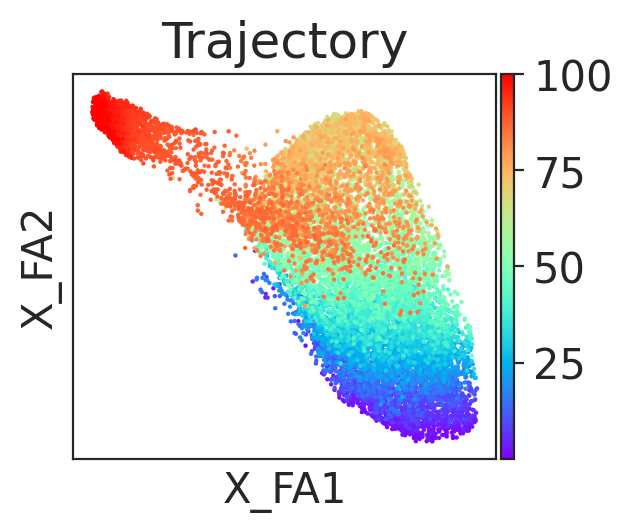

In [11]:
#5. [This step is optional] Compare simulation vector with development vectors
# 5.0. Method overview

#     As shown above, we can simulate how TF perturbations affect cell identity and visualize the results as a vector field map.

#     To interpret the results, it is necessary to take into account the direction of natural differentiation. We will compare the simulated perturbation vectors with the developmental gradient vectors. By comparing them, we can intuitively understand how TFs impact cell fate determination during development. This perspective is also important for estimating the experimental perturbation results.

#     Here, we will calculate the development vector field using pseudotime gradient as follows.

#     Transfer the pseudotime data into an n x n digitized grid.

#     Calculate the 2D gradient of pseudotime to get vector field.

#     Compare the in silico TF perturbation vector field with the development vector field by calculating inner product between these two vectors.

#     Note: Other methods may be used to represent a continuous scRNA-seq trajectory flow. For example, RNA velocity analysis is a good way to estimate the direction of cell differentiation. Choose the method that best suits your data.

# 5.1 Prepare pseudotime data

# In the analysis below, we will use pseudotime data. Pseudotime data is included in the demo data. If you are analyzing your own scRNA-seq data, please calculate pseudotime before starting this analysis.

# Refer to the following link below to see an example about calculating pseudotime for scRNA-seq data. https://morris-lab.github.io/CellOracle.documentation/tutorials/pseudotime.html
# 5.2. Check data


# Visualize pseudotime
fig, ax = plt.subplots(figsize=[3,2.5])

sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, ax=ax,cmap="rainbow",
                color=["Trajectory"],save=f"_{goi}_Trajectory.pdf")

plt.show()

In [12]:
#5.3. Make Gradient_calculator object
from celloracle.applications import Gradient_calculator

# Instantiate Gradient calculator object
gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="Trajectory")

In [13]:
# We need to set n_grid and min_mass for the pseudotime grid point calculation too. n_grid: Number of grid point.
# We already know approproate values for them. Please set the same values as step 4.2.1 above.

gradient.calculate_p_mass(smooth=.8, n_grid=n_grid, n_neighbors=200)
gradient.calculate_mass_filter(min_mass=min_mass, plot=False)

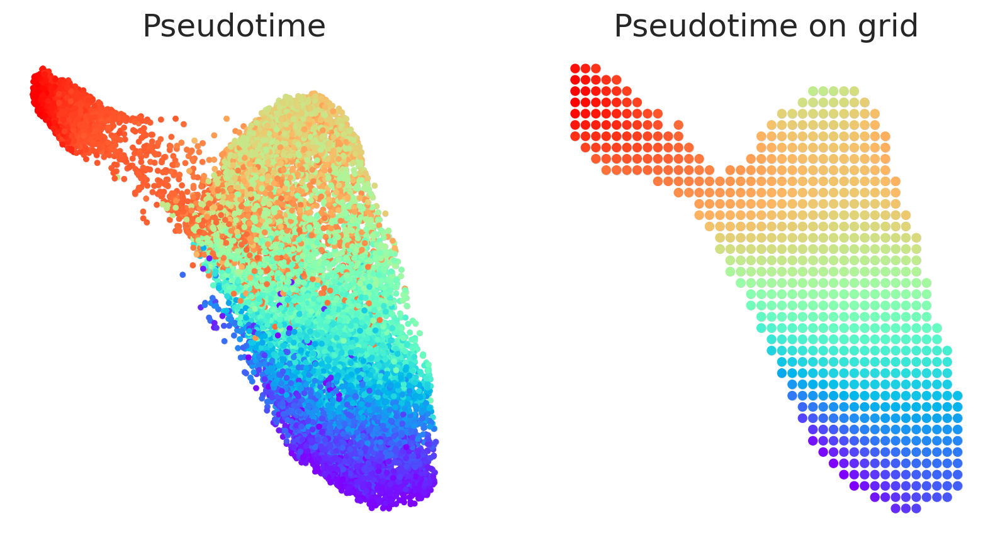

In [14]:
# 5.4 Transfer pseudotime values to the grid points.

# Next, we convert the pseudotime data into grid points. For this calculation we can chose one of two methods.

#     knn: K-Nearesr Neighbor regression. You will need to set number of neighbors.
#Please adjust n_knn for best results.This will depend on the population size and density of your scRNA-seq data.

# gradient.transfer_data_into_grid(args={"method": "knn", "n_knn":50})

#     polynomial: Polynomial regression using x-axis and y-axis of dimensional reduction space.

# In general, this method will be more robust. Please use this method if knn method does not work. 
#n_poly is the number of degrees for the polynomial regression model. 
#Please try to find appropriaten_poly searching for best results.

gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True)
plt.savefig(f"{save_folder}/{goi}_Pseudotime_PGrid.pdf")
plt.savefig(f"{save_folder}/{goi}_Pseudotime_PGrid.png")
plt.show()

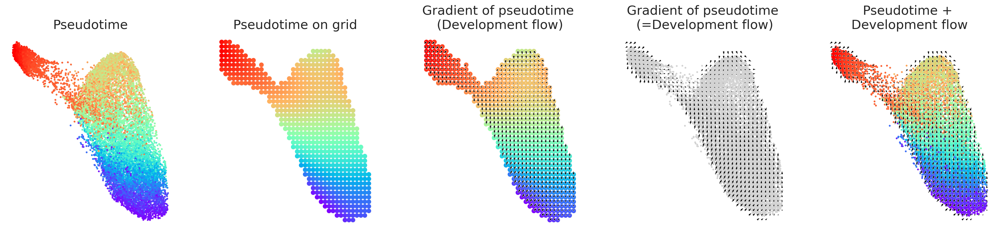

In [15]:
plt.rcParams.update({'font.size': 15})

# 5.5. Calculate Gradient vectors

# Calculate the 2D vector map to represents the pseudotime gradient. After the gradient calculation, the length
#of the vector will be normalized automatically.

# Please adjust the scale parameter to adjust vector length visualization.

# Calculate graddient
gradient.calculate_gradient()

# Show results
scale_dev = 35
gradient.visualize_results(scale=scale_dev, s=5)

plt.savefig(f"{save_folder}/{goi}_Pseudotime_DevelopmentFlow.pdf")
plt.savefig(f"{save_folder}/{goi}_Pseudotime_DevelopmentFlow.png")
plt.show()

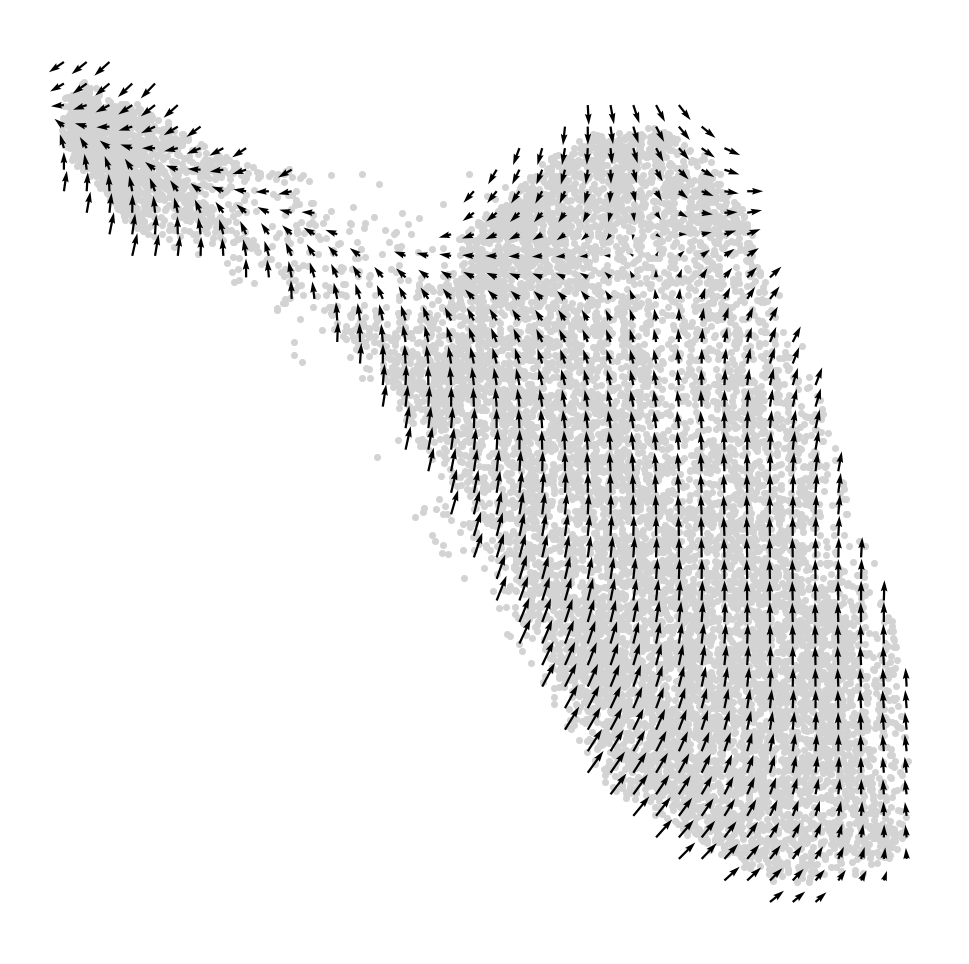

In [16]:
# Visualize results
fig, ax = plt.subplots(figsize=[6, 6])
gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

plt.savefig(f"{save_folder}/{goi}_DevelopmentFlow.pdf")
plt.savefig(f"{save_folder}/{goi}_DevelopmentFlow.png")
plt.show()

In [17]:
# 5.6. Calculate Inner product between two vectors

# We will use the inner product calculations to quantitatively compare the 2D developmental flow and perturbation simulation vectors.

#     If you are not familiar with Inner product / Dot product, please see https://en.wikipedia.org/wiki/Dot_product

#     The inner product represents the similarity between two vectors.

#     Using the inner product, we compare the 2D vector field of perturbation simulation and development flow.

#     The inner product will be a positive value when two vectors are pointing in the same direction.

#     Conversely, the inner product will be a negative value when two vectors are pointing in the opposing directions.

#     The length of the vectors also affects the magnitude of inner product value.

# In summary, we quantitatively compare the directionality and size of vectors between perturbation simulation and natural differentiation using inner product, and we define the score as perturbation score (PS).

#     A negative PS means that the TF perturbation would block differentiation .

#     A positive PS means that the TF perturbation would promote differentiation .
from celloracle.applications import Oracle_development_module

# Make Oracle_development_module to compare two vector field
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle)


# Calculate inner produc scores
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

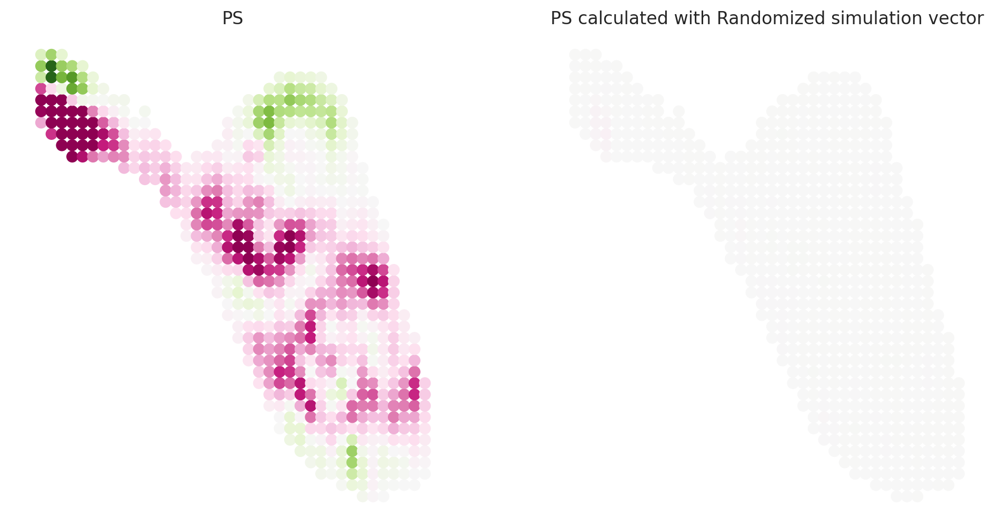

In [18]:
plt.rcParams.update({'font.size': 10})

# 5.7. Show results

#     Here, need to adjust the vm parameter for the PS score color visualization.
#Please seek to find the optimal vm parameter that provides good visualization.

# If you don't see any color in the left panel below, you can try 
#the smaller vm parameter to magnify the scale of vm visualization. 
#However, if you see colors in the randomized results (right panel), it means the vm parameter is too small.

# Show perturbation scores
vm = 0.035 #0.02

fig, ax = plt.subplots(1, 2, figsize=[12, 6])
dev.plot_inner_product_on_grid(vm=0.01, s=50, ax=ax[0])
ax[0].set_title(f"PS")

dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
ax[1].set_title(f"PS calculated with Randomized simulation vector")


plt.savefig(f"{save_folder}/{goi}_PS_calculated_with_Randomized.pdf")
plt.savefig(f"{save_folder}/{goi}_PS_calculated_with_Randomized.png") #perturbation score - PS
plt.show()

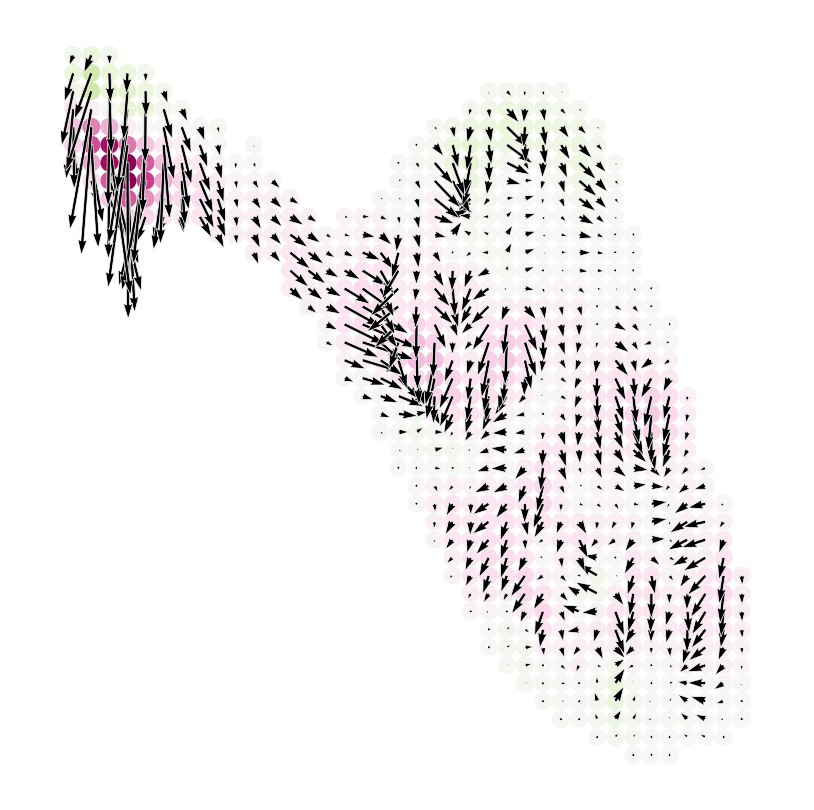

In [19]:
# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[5, 5])
dev.plot_inner_product_on_grid(vm=vm, s=30, ax=ax)


dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)

plt.savefig(f"{save_folder}/{goi}_PS_in_FlowDevelopmentSimulated.pdf")
plt.savefig(f"{save_folder}/{goi}_PS_in_FlowDevelopmentSimulated.png")

# Figure 6 e and f

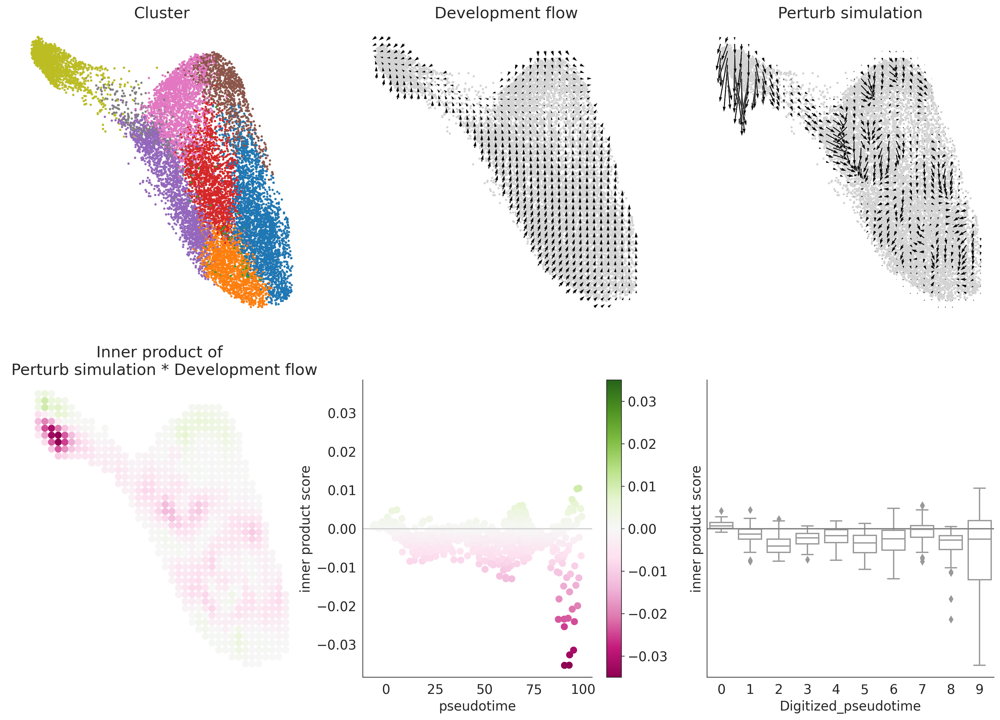

In [20]:
# Let's visualize the results 
plt.rcParams.update({'font.size': 15})

dev.visualize_development_module_layout_0(s=5, 
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev, 
                                          vm=vm)
plt.savefig(f"{save_folder}/{goi}_FinalResult.pdf")
plt.savefig(f"{save_folder}/{goi}_FinalResult.png")

# Figure 6 d and h

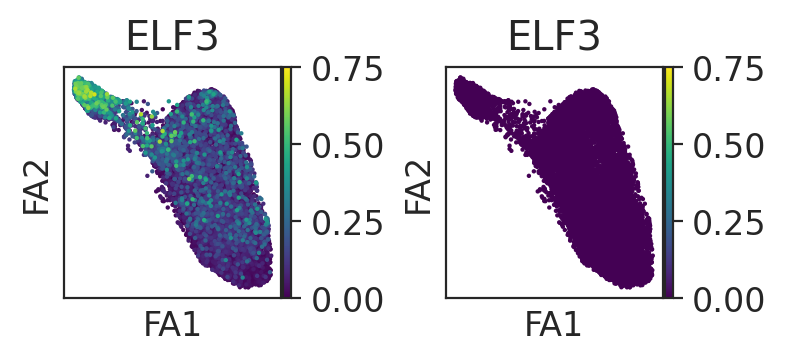

In [22]:
plt.rcParams.update({'font.size': 12})

ge="ELF3"
row=0
# The mv value change  for each gene is the max expression between after and before KO
mv=.75 
# The values for Figure 6D: ELF3 mv=.75
#                Figure 6H: TPM1 mv=2
#                           VCAM1 mv=.75
#                           ITGB8 mv=3
fig, ax = plt.subplots(1, 2,  figsize=[4,1.5], gridspec_kw={'wspace':0.6})
sc.pl.draw_graph(oracle.adata,color=ge,vmax=mv,
                  layer="imputed_count", use_raw=False, ax=ax[0], cmap="viridis", size=10,show=False)
sc.pl.draw_graph(oracle.adata, color=ge,vmax=mv,
                 layer="simulated_count", use_raw=False,ax=ax[1], cmap="viridis", size=10,show=False)
plt.show()

In [25]:
## Perform differential expression analysis aPT PT-S12 before and after KO
sc.tl.rank_genes_groups(oracle.adata, groupby='PT12_l3', layer="imputed_count",method='wilcoxon')
#The logfoldchanges are now stored in the adata object
result = oracle.adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
groups
df1 = pd.DataFrame({group+'' + key:result[key][group] for group in groups for key in ['names','scores','logfoldchanges','pvals','pvals_adj']})

sc.tl.rank_genes_groups(oracle.adata, groupby='PT12_l3', layer="simulated_count",method='wilcoxon')
#The logfoldchanges are now stored in the adata object
result = oracle.adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
groups

df2 = pd.DataFrame({group+'' + key:result[key][group] for group in groups for key in ['names','scores','logfoldchanges','pvals','pvals_adj']})

In [26]:
df1.to_csv(f"{res}scMEGA_cor40_{goi}_wilcoxon_PT12_l3_imputed_count.csv")
df2.to_csv(f"{res}scMEGA_cor40_{goi}_wilcoxon_PT12_l3_simulated_count.csv")

In [28]:
# Calculate the absolute difference betwenn gene expression befor and after KO
d1=df1[['aPTnames', 'aPTlogfoldchanges', 'aPTpvals_adj']]
d2=df2[['aPTnames', 'aPTlogfoldchanges', 'aPTpvals_adj']]
d3=pd.merge(d1, d2, on='aPTnames')
d3=d3[(d3["aPTlogfoldchanges_x"] != d3["aPTlogfoldchanges_y"]) ]
d3=d3[(d3["aPTpvals_adj_x"] <0.05) ]
d3['UP_DEG'] = "PT"
d3.loc[d3['aPTlogfoldchanges_x'] > 0, 'UP_DEG'] = "aPT"
d3['abs_diff']=abs(d3["aPTlogfoldchanges_x"]-d3["aPTlogfoldchanges_y"])
d3=d3.sort_values(by=['abs_diff'], ascending=False)



d4= d3[d3['UP_DEG'] == "PT"]
d4 = d4.sort_values(by=['abs_diff'], ascending=True)
#d4=d4[len(d4)-25:len(d4)]

d5= d3[d3['UP_DEG'] == "aPT"]
d5 = d5.sort_values(by=['abs_diff'], ascending=False)

df=pd.concat([d4,d5])
# df.to_csv(f"{save_folder}/{goi}_dotplot_aPT_{len(d5)}_PT_{len(d4)}.csv")
df

#plt.scatter(d3[["aPTlogfoldchanges_x"]], d3[["aPTlogfoldchanges_y"]])
#d5=d5[:25]


# Figure 6g

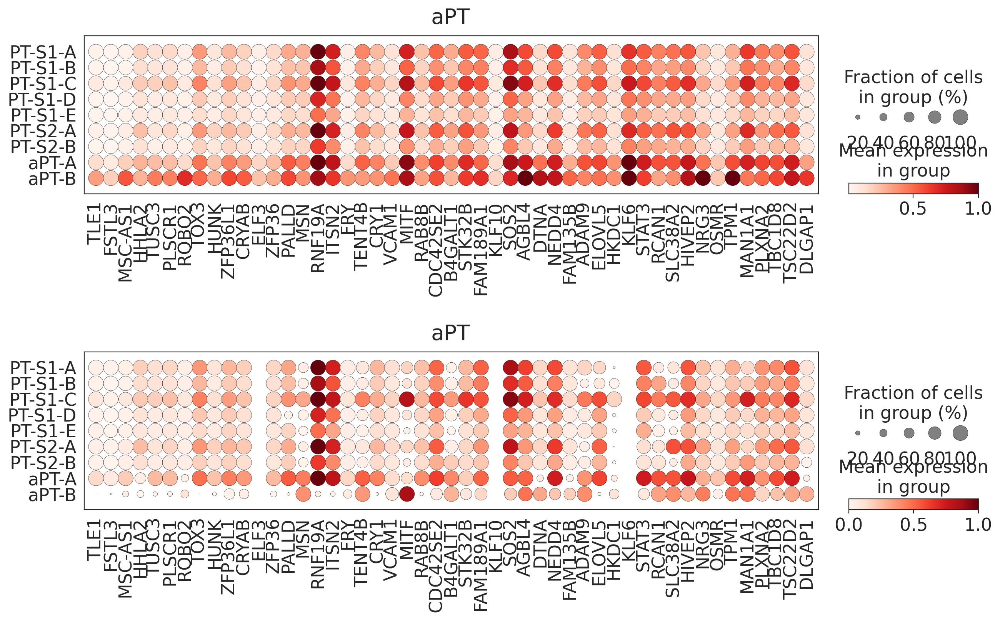

In [41]:
d6= d4[:0]#d4[len(d4)-50:len(d4)]

d7=d5[:49]


marker_genes_dict = {
    #'PT-S12': d6["aPTnames"],
    'aPT': d7["aPTnames"],
}



plt.rcParams.update({'font.size': 20})

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,8), gridspec_kw={'wspace':0.5,
                                                               'hspace':1})

sc.pl.dotplot(oracle.adata, marker_genes_dict,'louvain_annot',layer="imputed_count",vmax=1,
              dendrogram=False,ax=ax1,figsize=(10,4),show=False)
sc.pl.dotplot(oracle.adata, marker_genes_dict,'louvain_annot',layer="simulated_count",
              vmax=1,dendrogram=False,ax=ax2,figsize=(10,4),show=False)
plt.savefig(f"{save_folder}/{goi}_dotplot_PT_{len(d6)}_aPT_{len(d7)}.png")
plt.savefig(f"{save_folder}/{goi}_dotplot_PT_{len(d6)}_aPT_{len(d7)}.pdf")
plt.show()